In [29]:
import pandas as pd
from gensim import corpora, models
import numpy as np
import re
import itertools
import matplotlib.pyplot as plt
from matplotlib.font_manager import FontProperties

In [113]:
import gensim

In [3]:
#读取数据，已经分词并去除停用词
data=pd.read_excel(r'C:\\Users\\X1\\Desktop\\预处理&分词\\分词结果.xlsx')

In [8]:
text=data[['强化学习后正文分词结果']]

In [10]:
type(text)

pandas.core.frame.DataFrame

In [14]:
#建立词典
#pos_dict = corpora.Dictionary([[i] for i in posdata['word']])
text_dict = corpora.Dictionary([[i] for i in data['强化学习后正文分词结果']])

In [15]:
text_dict

In [16]:
#建立语料库
#pos_corpus = [pos_dict.doc2bow(j) for j in [[i] for i in posdata['word']]]
text_corpus = [text_dict.doc2bow(j) for j in [[i] for i in data['强化学习后正文分词结果']]]

In [19]:
len(text_corpus)

32791

In [20]:
# 构造主题数寻优函数
def cos(vector1, vector2):  # 余弦相似度函数
    dot_product = 0.0;  
    normA = 0.0;  
    normB = 0.0;  
    for a,b in zip(vector1, vector2): 
        dot_product += a*b  
        normA += a**2  
        normB += b**2  
    if normA == 0.0 or normB==0.0:  
        return(None)  
    else:  
        return(dot_product / ((normA*normB)**0.5))  

In [21]:
# 主题数寻优
def lda_k(x_corpus, x_dict):  
    
    # 初始化平均余弦相似度
    mean_similarity = []
    mean_similarity.append(1)
    
    # 循环生成主题并计算主题间相似度
    for i in np.arange(2,11):
        lda = models.LdaModel(x_corpus, num_topics=i, id2word=x_dict)  # LDA模型训练
        for j in np.arange(i):
            term = lda.show_topics(num_words=50)
            
        # 提取各主题词
        top_word = []
        for k in np.arange(i):
            top_word.append([''.join(re.findall('"(.*)"',i)) \
                           for i in term[k][1].split('+')])  # 列出所有词
           
        # 构造词频向量
        word = sum(top_word,[])  # 列出所有的词   
        unique_word = set(word)  # 去除重复的词
        
        # 构造主题词列表，行表示主题号，列表示各主题词
        mat = []
        for j in np.arange(i):
            top_w = top_word[j]
            mat.append(tuple([top_w.count(k) for k in unique_word]))  
            
        p = list(itertools.permutations(list(np.arange(i)),2))
        l = len(p)
        top_similarity = [0]
        for w in np.arange(l):
            vector1 = mat[p[w][0]]
            vector2 = mat[p[w][1]]
            top_similarity.append(cos(vector1, vector2))
            
        # 计算平均余弦相似度
        mean_similarity.append(sum(top_similarity)/l)
    return(mean_similarity)

In [28]:
# 计算主题平均余弦相似度
#pos_k = lda_k(pos_corpus, pos_dict)
text_k = lda_k(text_corpus,text_dict)

Text(0.5, 0, '正面评论LDA主题数寻优')

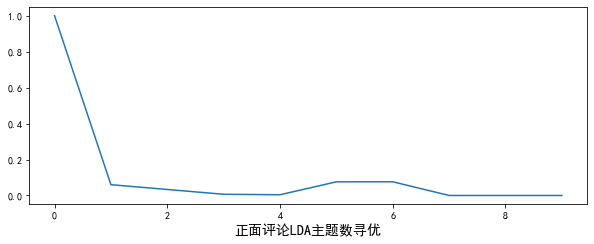

In [31]:
font = FontProperties(size=14)
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False  
fig = plt.figure(figsize=(10,8))
ax1 = fig.add_subplot(211)
ax1.plot(text_k)
ax1.set_xlabel('正面评论LDA主题数寻优', fontproperties=font)

In [33]:
# LDA主题分析
#pos_lda = models.LdaModel(pos_corpus, num_topics=3, id2word=pos_dict)
text_lda = models.LdaModel(text_corpus,num_topics=6,id2word=text_dict)
#pos_lda.print_topics(num_words=10)
text_lda.print_topics(num_words=1)

[(0,
  '0.000*"[\'李克强\', \'赞誉\', \'创客\', \'小镇\', \'创意\', \'新经济\', \'借壳\', \'传统产业\', \'上市\', \'李克强\', \'考察\', \'成都\', \'菁蓉\', \'创客\', \'小镇\', \'工人\', \'宿舍\', \'传统\', \'产能\', \'减弱\', \'房屋\', \'大量\', \'闲置\', \'当地政府\', \'房租\', \'形式\', \'吸引\', \'创业者\', \'入住\', \'依托\', \'高校\', \'企业\', \'形成\', \'创客\', \'小镇\', \'总理\', \'赞誉\', \'这一\', \'想法\', \'富有\', \'创意\', \'空置\', \'宿舍\', \'巧变\', \'创客\', \'空间\', \'好比\', \'新经济\', \'借壳\', \'传统产业\', \'上市\', \'李克强\', \'新经济\', \'指数\', \'双创\', \'指数\', \'做成\', \'决策\', \'重要\', \'参考依据\', \'李克强\', \'考察\', \'成都\', \'菁蓉\', \'创客\', \'小镇\', \'电子科\', \'国家信息中心\', \'汇聚\', \'数十亿\', \'数据\', \'机构\', \'合推\', \'新经济\', \'指数\', \'双创\', \'指数\', \'备感\', \'兴趣\', \'项目\', \'负责人\', \'提出\', \'希望\', \'获得\', \'数据\', \'总理\', \'部门\', \'认真\', \'研究\', \'两项\', \'指数\', \'做成\', \'决策\', \'重要\', \'参考依据\', \'李克强\', \'双创\', \'充分调动\', \'每个\', \'个体\', \'积极性\', \'李克强\', \'考察\', \'四川\', \'成都\', \'菁蓉\', \'创客\', \'小镇\', \'一位\', \'创客\', \'播放\', \'电视剧\', \'历史\', \'转折\', \'邓小平\', \'展示\', \'公司\', \'最新款\', \'家用\'

In [34]:
from gensim import corpora
from gensim.models import LdaModel
from gensim.corpora import Dictionary

In [35]:
train = []

In [99]:
list(data['强化学习后正文分词结果'])

["['习近平', '全军', '后勤工作', '会议', '作出', '重要', '指示', '强调', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '新华社', '北京', '日电', '记者', '梅常伟', '全军', '后勤工作', '会议', '日至', '召开', '中共中央', '总书记', '国家', '主席', '中央军委主席', '习近平', '作出', '重要', '指示', '全军', '后勤', '战线', '全体', '同志', '致以', '诚挚', '问候', '习近平', '强调', '党的十八大以来', '全军', '后勤', '战线', '坚决贯彻', '党中央', '中央军委', '决策', '部署', '聚焦', '保障', '打赢', '积极', '改革', '创新', '着力', '建设', '打仗', '后勤', '我军', '建设', '发展', '有效', '履行', '使命', '任务', '作出', '重要', '贡献', '希望', '同志', '深入', '贯彻', '时代', '强军', '思想', '深入', '贯彻', '时代', '军事', '战略方针', '加快', '推进', '十四五', '规划', '任务', '落实', '加快', '建设', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '中共中央政治局', '委员', '中央军委', '副主席', '出席会议', '讲话', '强调', '深入', '贯彻', '主席', '重要', '指示', '决策', '部署', '围绕', '支撑', '实现', '建军', '一百年', '奋斗目标', '聚力', '创新', '转型', '突出', '规范', '集约', '注重', '过硬', '扭住', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '

In [106]:
texts=data['强化学习后正文分词结果']

In [85]:
text=data[['强化学习后正文分词结果']].values

In [87]:
text

array([["['习近平', '全军', '后勤工作', '会议', '作出', '重要', '指示', '强调', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '新华社', '北京', '日电', '记者', '梅常伟', '全军', '后勤工作', '会议', '日至', '召开', '中共中央', '总书记', '国家', '主席', '中央军委主席', '习近平', '作出', '重要', '指示', '全军', '后勤', '战线', '全体', '同志', '致以', '诚挚', '问候', '习近平', '强调', '党的十八大以来', '全军', '后勤', '战线', '坚决贯彻', '党中央', '中央军委', '决策', '部署', '聚焦', '保障', '打赢', '积极', '改革', '创新', '着力', '建设', '打仗', '后勤', '我军', '建设', '发展', '有效', '履行', '使命', '任务', '作出', '重要', '贡献', '希望', '同志', '深入', '贯彻', '时代', '强军', '思想', '深入', '贯彻', '时代', '军事', '战略方针', '加快', '推进', '十四五', '规划', '任务', '落实', '加快', '建设', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '中共中央政治局', '委员', '中央军委', '副主席', '出席会议', '讲话', '强调', '深入', '贯彻', '主席', '重要', '指示', '决策', '部署', '围绕', '支撑', '实现', '建军', '一百年', '奋斗目标', '聚力', '创新', '转型', '突出', '规范', '集约', '注重', '过硬', '扭住', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', 

In [77]:
train.append(text[1])

In [53]:
for i in text:
    train.append([i])

In [78]:
train

[["['习近平', '全军', '后勤工作', '会议', '作出', '重要', '指示', '强调', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '新华社', '北京', '日电', '记者', '梅常伟', '全军', '后勤工作', '会议', '日至', '召开', '中共中央', '总书记', '国家', '主席', '中央军委主席', '习近平', '作出', '重要', '指示', '全军', '后勤', '战线', '全体', '同志', '致以', '诚挚', '问候', '习近平', '强调', '党的十八大以来', '全军', '后勤', '战线', '坚决贯彻', '党中央', '中央军委', '决策', '部署', '聚焦', '保障', '打赢', '积极', '改革', '创新', '着力', '建设', '打仗', '后勤', '我军', '建设', '发展', '有效', '履行', '使命', '任务', '作出', '重要', '贡献', '希望', '同志', '深入', '贯彻', '时代', '强军', '思想', '深入', '贯彻', '时代', '军事', '战略方针', '加快', '推进', '十四五', '规划', '任务', '落实', '加快', '建设', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '中共中央政治局', '委员', '中央军委', '副主席', '出席会议', '讲话', '强调', '深入', '贯彻', '主席', '重要', '指示', '决策', '部署', '围绕', '支撑', '实现', '建军', '一百年', '奋斗目标', '聚力', '创新', '转型', '突出', '规范', '集约', '注重', '过硬', '扭住', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', 

In [47]:
texts

["['习近平', '全军', '后勤工作', '会议', '作出', '重要', '指示', '强调', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '新华社', '北京', '日电', '记者', '梅常伟', '全军', '后勤工作', '会议', '日至', '召开', '中共中央', '总书记', '国家', '主席', '中央军委主席', '习近平', '作出', '重要', '指示', '全军', '后勤', '战线', '全体', '同志', '致以', '诚挚', '问候', '习近平', '强调', '党的十八大以来', '全军', '后勤', '战线', '坚决贯彻', '党中央', '中央军委', '决策', '部署', '聚焦', '保障', '打赢', '积极', '改革', '创新', '着力', '建设', '打仗', '后勤', '我军', '建设', '发展', '有效', '履行', '使命', '任务', '作出', '重要', '贡献', '希望', '同志', '深入', '贯彻', '时代', '强军', '思想', '深入', '贯彻', '时代', '军事', '战略方针', '加快', '推进', '十四五', '规划', '任务', '落实', '加快', '建设', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '中共中央政治局', '委员', '中央军委', '副主席', '出席会议', '讲话', '强调', '深入', '贯彻', '主席', '重要', '指示', '决策', '部署', '围绕', '支撑', '实现', '建军', '一百年', '奋斗目标', '聚力', '创新', '转型', '突出', '规范', '集约', '注重', '过硬', '扭住', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '

In [68]:
dictionary = corpora.Dictionary(text) 

In [69]:
dictionary

In [70]:
dictionary.token2id

{"['习近平', '全军', '后勤工作', '会议', '作出', '重要', '指示', '强调', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '新华社', '北京', '日电', '记者', '梅常伟', '全军', '后勤工作', '会议', '日至', '召开', '中共中央', '总书记', '国家', '主席', '中央军委主席', '习近平', '作出', '重要', '指示', '全军', '后勤', '战线', '全体', '同志', '致以', '诚挚', '问候', '习近平', '强调', '党的十八大以来', '全军', '后勤', '战线', '坚决贯彻', '党中央', '中央军委', '决策', '部署', '聚焦', '保障', '打赢', '积极', '改革', '创新', '着力', '建设', '打仗', '后勤', '我军', '建设', '发展', '有效', '履行', '使命', '任务', '作出', '重要', '贡献', '希望', '同志', '深入', '贯彻', '时代', '强军', '思想', '深入', '贯彻', '时代', '军事', '战略方针', '加快', '推进', '十四五', '规划', '任务', '落实', '加快', '建设', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '中共中央政治局', '委员', '中央军委', '副主席', '出席会议', '讲话', '强调', '深入', '贯彻', '主席', '重要', '指示', '决策', '部署', '围绕', '支撑', '实现', '建军', '一百年', '奋斗目标', '聚力', '创新', '转型', '突出', '规范', '集约', '注重', '过硬', '扭住', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '

In [1]:
import jieba
import pandas as pd
import warnings
import numpy as np
import struct
import os
import operator
import collections
from pandas import DataFrame
from wordcloud import WordCloud
import matplotlib.pyplot as plt
warnings.filterwarnings('ignore')

In [3]:
import json

In [110]:
texts.iloc[0]

"['习近平', '全军', '后勤工作', '会议', '作出', '重要', '指示', '强调', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '新华社', '北京', '日电', '记者', '梅常伟', '全军', '后勤工作', '会议', '日至', '召开', '中共中央', '总书记', '国家', '主席', '中央军委主席', '习近平', '作出', '重要', '指示', '全军', '后勤', '战线', '全体', '同志', '致以', '诚挚', '问候', '习近平', '强调', '党的十八大以来', '全军', '后勤', '战线', '坚决贯彻', '党中央', '中央军委', '决策', '部署', '聚焦', '保障', '打赢', '积极', '改革', '创新', '着力', '建设', '打仗', '后勤', '我军', '建设', '发展', '有效', '履行', '使命', '任务', '作出', '重要', '贡献', '希望', '同志', '深入', '贯彻', '时代', '强军', '思想', '深入', '贯彻', '时代', '军事', '战略方针', '加快', '推进', '十四五', '规划', '任务', '落实', '加快', '建设', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '加快', '推动', '现代', '后勤', '高质量', '发展', '实现', '建军', '一百年', '奋斗目标', '提供', '有力', '支撑', '中共中央政治局', '委员', '中央军委', '副主席', '出席会议', '讲话', '强调', '深入', '贯彻', '主席', '重要', '指示', '决策', '部署', '围绕', '支撑', '实现', '建军', '一百年', '奋斗目标', '聚力', '创新', '转型', '突出', '规范', '集约', '注重', '过硬', '扭住', '现代', '军事', '物流', '体系', '军队', '现代', '资产管理', '体系', '建

In [111]:
import ast

In [112]:
ast.literal_eval(texts.iloc[0])

['习近平',
 '全军',
 '后勤工作',
 '会议',
 '作出',
 '重要',
 '指示',
 '强调',
 '加快',
 '推动',
 '现代',
 '后勤',
 '高质量',
 '发展',
 '实现',
 '建军',
 '一百年',
 '奋斗目标',
 '提供',
 '有力',
 '支撑',
 '新华社',
 '北京',
 '日电',
 '记者',
 '梅常伟',
 '全军',
 '后勤工作',
 '会议',
 '日至',
 '召开',
 '中共中央',
 '总书记',
 '国家',
 '主席',
 '中央军委主席',
 '习近平',
 '作出',
 '重要',
 '指示',
 '全军',
 '后勤',
 '战线',
 '全体',
 '同志',
 '致以',
 '诚挚',
 '问候',
 '习近平',
 '强调',
 '党的十八大以来',
 '全军',
 '后勤',
 '战线',
 '坚决贯彻',
 '党中央',
 '中央军委',
 '决策',
 '部署',
 '聚焦',
 '保障',
 '打赢',
 '积极',
 '改革',
 '创新',
 '着力',
 '建设',
 '打仗',
 '后勤',
 '我军',
 '建设',
 '发展',
 '有效',
 '履行',
 '使命',
 '任务',
 '作出',
 '重要',
 '贡献',
 '希望',
 '同志',
 '深入',
 '贯彻',
 '时代',
 '强军',
 '思想',
 '深入',
 '贯彻',
 '时代',
 '军事',
 '战略方针',
 '加快',
 '推进',
 '十四五',
 '规划',
 '任务',
 '落实',
 '加快',
 '建设',
 '现代',
 '军事',
 '物流',
 '体系',
 '军队',
 '现代',
 '资产管理',
 '体系',
 '加快',
 '推动',
 '现代',
 '后勤',
 '高质量',
 '发展',
 '实现',
 '建军',
 '一百年',
 '奋斗目标',
 '提供',
 '有力',
 '支撑',
 '中共中央政治局',
 '委员',
 '中央军委',
 '副主席',
 '出席会议',
 '讲话',
 '强调',
 '深入',
 '贯彻',
 '主席',
 '重要',
 '指示',
 '决策',
 '部署',
 '围绕',
 '支撑',

In [ ]:
for topic in ldamodel.print_topics(num_words = 20):
    termNumber = topic[0]
    print(topic[0], ':', sep='')
    listOfTerms = topic[1].split('+')
    for term in listOfTerms:
        listItems = term.split('*')
        print('  ', listItems[1], '(', listItems[0], ')', sep='')